In [1]:
import pandas as pd
import seaborn as sns 
import plotly.express as px
import matplotlib.pyplot as plt
from scipy.stats import zscore




In [2]:
df = pd.read_csv("raw_data/togo-dapaong_qc.csv")  


In [3]:
df.describe()

,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,230.555040,151.258469,116.444352,226.144375,219.568588,27.751788,55.013160,2.368093,3.229490,0.557740,161.741845,10.559568,975.915242,0.000535,0.001382,32.444403,33.543330,NaN
std,322.532347,250.956962,156.520714,317.346938,307.932510,4.758023,28.778732,1.462668,1.882565,0.268923,91.877217,5.915490,2.153977,0.023116,0.026350,10.998334,12.769277,NaN
min,-12.700000,0.000000,0.000000,0.000000,0.000000,14.900000,3.300000,0.000000,0.000000,0.000000,0.000000,0.000000,968.000000,0.000000,0.000000,13.100000,13.100000,NaN
25%,-2.200000,0.000000,0.000000,0.000000,0.000000,24.200000,26.500000,1.400000,1.900000,0.400000,74.800000,6.900000,975.000000,0.000000,0.000000,23.900000,23.600000,NaN
50%,2.100000,0.000000,2.500000,4.400000,4.300000,27.200000,59.300000,2.200000,2.900000,0.500000,199.100000,10.800000,976.000000,0.000000,0.000000,28.400000,28.400000,NaN
75%,442.400000,246.400000,215.700000,422.525000,411.000000,31.100000,80.800000,3.200000,4.400000,0.700000,233.500000,14.100000,977.000000,0.000000,0.000000,40.600000,43.000000,NaN
max,1424.000000,1004.500000,805.700000,1380.000000,1367.000000,41.400000,99.800000,16.100000,23.100000,4.700000,360.000000,86.900000,983.000000,1.000000,2.300000,70.400000,94.600000,NaN


In [4]:
missing = df.isna().sum()
missing[missing > 0]


Comments    525600
dtype: int64

In [5]:
missing_percent = (df.isna().sum() / len(df)) * 100
missing_percent[missing_percent > 5]


Comments    100.0
dtype: float64

outline detection with Z-scores

In [6]:
columns_to_check = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']

for col in columns_to_check:
    df[f'{col}_zscore'] = zscore(df[col].fillna(df[col].median()))
    
outliers = df[(df[[f'{col}_zscore' for col in columns_to_check]].abs() > 3).any(axis=1)]
print(f"Total outliers: {len(outliers)}")


Total outliers: 9251


drop or impute missing values

In [7]:
for col in columns_to_check:
   df[col] = df[col].fillna(df[col].median())



In [8]:
df_clean = df[(df[[f'{col}_zscore' for col in columns_to_check]].abs() <= 3).all(axis=1)]



export cleaned csv


In [9]:
df_clean.to_csv("data/togo-clean.csv", index=False)


Time series plots

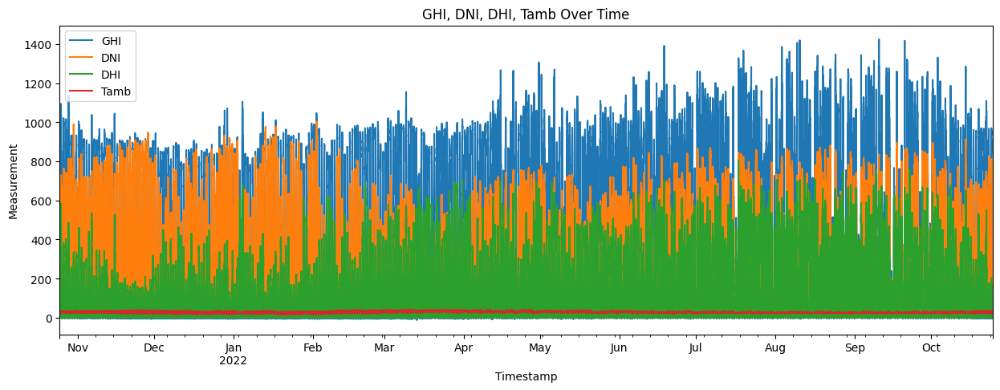

In [25]:
df['Timestamp'] = pd.to_datetime(df['Timestamp'])  

df.set_index('Timestamp')[['GHI', 'DNI', 'DHI', 'Tamb']].plot(figsize=(15, 5))
plt.title("GHI, DNI, DHI, Tamb Over Time")
plt.ylabel("Measurement")
plt.xlabel("Timestamp")
plt.show()


cleaning impact


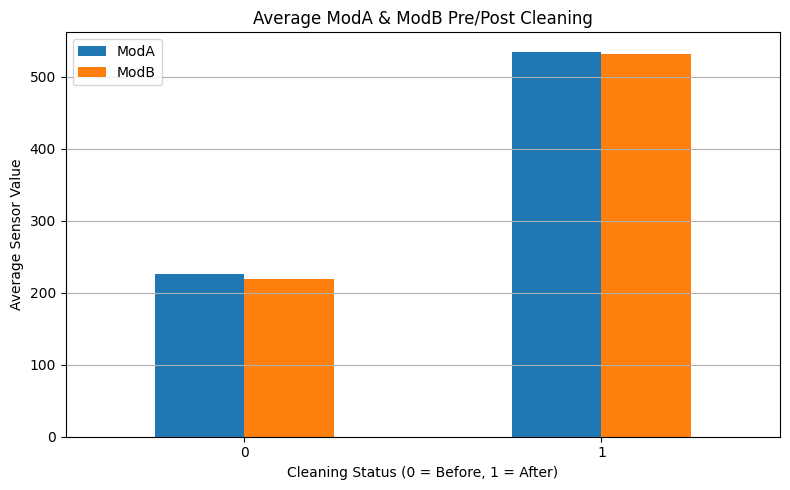

In [26]:
cleaning_group = df.groupby('Cleaning')[['ModA', 'ModB']].mean()

# Plotting
cleaning_group.plot(kind='bar', figsize=(8, 5))
plt.title('Average ModA & ModB Pre/Post Cleaning')
plt.ylabel('Average Sensor Value')
plt.xlabel('Cleaning Status (0 = Before, 1 = After)')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


correlation heatmap

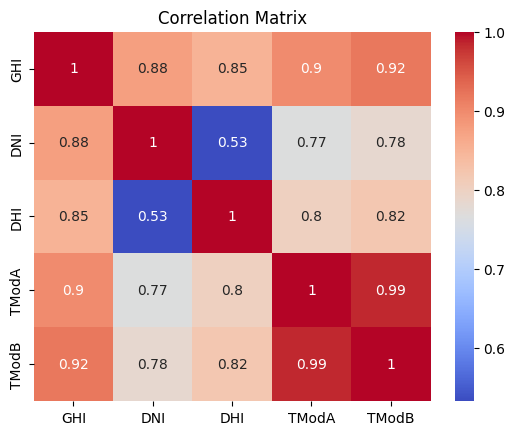

In [27]:
corr = df[['GHI', 'DNI', 'DHI', 'TModA', 'TModB']].corr()
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()


scatter plots

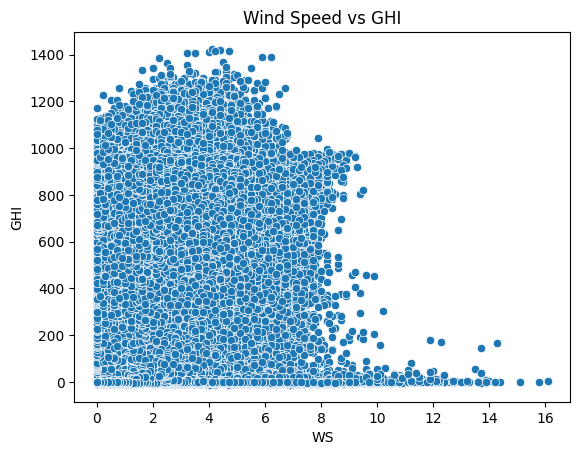

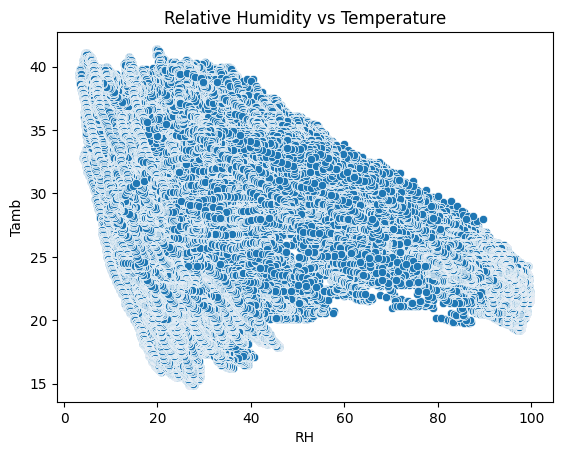

In [28]:
sns.scatterplot(data=df, x='WS', y='GHI')
plt.title("Wind Speed vs GHI")
plt.show()

sns.scatterplot(data=df, x='RH', y='Tamb')
plt.title("Relative Humidity vs Temperature")
plt.show()


Histograms

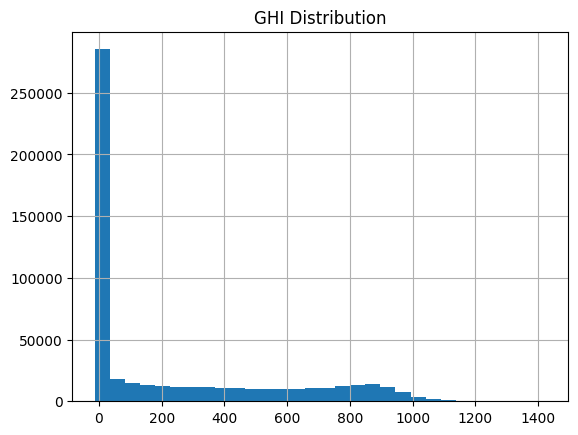

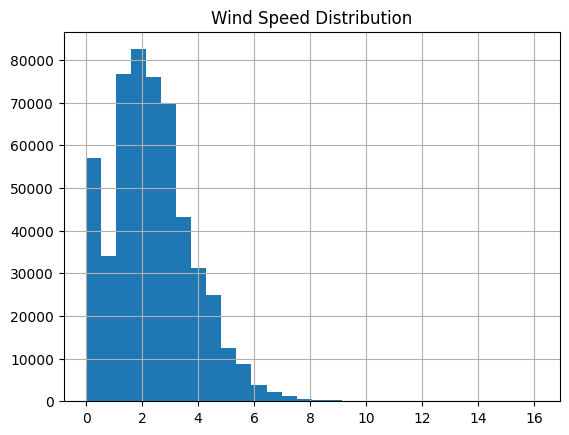

In [29]:
df['GHI'].hist(bins=30)
plt.title("GHI Distribution")
plt.show()

df['WS'].hist(bins=30)
plt.title("Wind Speed Distribution")
plt.show()


Bubble chart

In [30]:
fig = px.scatter(df, x="GHI", y="Tamb", size="RH", color="BP",
                 title="GHI vs Tamb (Bubble = RH, Color = BP)",
                 labels={"GHI":"Global Horizontal Irradiance", "Tamb":"Ambient Temperature"})
fig.show()
